In [1]:
import numpy as np
import pandas as pd

import anndata as ad
import scanpy as sc
import scanpy.external as sce
from scipy import sparse
import gc

import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib import rcParams
import matplotlib.colors as clr

In [2]:
from scipy import io
import os
import gzip

In [38]:
merfish = sc.read_h5ad("data/ns-atlas.merfish_baysor.scanvi_integrated.cellcharter.anndata.annotated.h5ad")

In [39]:
merfish_samples = np.unique(merfish.obs['sample_barcode'].values.tolist())

In [40]:
merfish.X = merfish.layers['counts'].copy()
gc.collect()

79799

In [6]:
scrna = sc.read_h5ad("data/normal_skin.scrna.harmony.integrated.reclustered.annotated.genes_filtered.tangram_input.h5ad")

In [7]:
scrna.X = scrna.layers['counts'].copy()
all_genes = scrna.var_names.values.tolist()

In [41]:
overlapping_genes = merfish.var_names[[x == 'Both' for x in merfish.var['gene_panel']]].values.tolist()

In [9]:
gc.collect()

11

In [10]:
scrna.obs['cell_type.detailed'].value_counts().sort_index()

cell_type.detailed
Bas Inf             5398
Bas KC             35398
Bulge               3801
CCR7+ DC             493
CD1C+ DC            8871
CD4+ Th            19313
CD4+ Treg           5738
CD8+ Tc            16368
CLEC9A+ DC          1459
Cyc Imm              518
Cyc KC             13326
DP                  1229
DS                  3022
Diff Inf            4834
Ecc Duct            1995
Ecc Gland           1365
Grn KC              3520
HEC                 9283
IRS/HS               227
LC                  2116
LEC                 4023
Mac                 9717
Mast                1422
Melano             10967
Mono                3027
Naïve T             3299
ORS Basal            566
ORS Suprabasal      1576
Papil Fib           3061
Peri               11820
Perivasc Fib I      2146
Perivasc Fib II     6166
Plasma               976
Retic Fib I        15288
Retic Fib II         369
Retic Fib III        465
SM                   367
Schwann              218
Spn KC I           47671
Spn KC

In [11]:
scrna

AnnData object with n_obs × n_vars = 273178 × 14762
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'pct.mito', 'pct.ribo', 'pct.hemo', 'study_id', 'sample_barcode', 'donor_id', 'donor_sex', 'donor_age', 'anatomic_site', 'reported.cell_type', 'anatomic_site.detailed', 'harmony.snn_res.0.2', 'harmony.snn_res.0.4', 'harmony.snn_res.0.5', 'harmony.snn_res.0.6', 'harmony.snn_res.0.8', 'harmony.snn_res.1', 'harmony.snn_res.1.2', 'harmony.snn_res.1.5', 'harmony.snn_res.2', 'harmony.snn_res.2.5', 'seurat_clusters', 'cell_barcode', 'cell_type.broad', 'cell_category', 'cell_type', 'cell_type.broad.res_0.2', 'cell_type.detailed', 'cell_type.reclustered', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_varia

In [20]:
merged = ad.concat([merfish, scrna], label='assay', keys=['merfish', 'scrna'], index_unique=None)
overlapping_genes = merged.var_names[[x == 'Both' for x in merfish.var['gene_panel']]].values.tolist()
merged = merged[: , overlapping_genes].copy()

In [21]:
merged

AnnData object with n_obs × n_vars = 1475064 × 434
    obs: 'cell_barcode', 'donor_id', 'donor_sex', 'anatomic_site', 'n_counts', 'cell_type.broad', 'cell_category', 'cell_type.detailed', 'donor_age', 'sample_barcode', 'assay'
    layers: 'counts', 'log1p'

In [22]:
merged.X = merged.layers['counts'].copy()
sc.pp.normalize_total(merged)
sc.pp.log1p(merged)
merged.layers['log1p'] = merged.X.copy()
sc.pp.scale(merged)
merged.layers['scaled'] = merged.X.copy()

/hpc/packages/minerva-rocky9/py_packages/3.12/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


In [23]:
sc.tl.pca(merged, n_comps=30)
sce.pp.harmony_integrate(merged, key='sample_barcode', adjusted_basis='harmony')

2025-08-06 09:22:25,838 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-08-06 09:23:36,340 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-08-06 09:23:42,845 - harmonypy - INFO - Iteration 1 of 10
2025-08-06 09:42:00,827 - harmonypy - INFO - Iteration 2 of 10
2025-08-06 10:00:15,626 - harmonypy - INFO - Iteration 3 of 10
2025-08-06 10:17:50,077 - harmonypy - INFO - Iteration 4 of 10
2025-08-06 10:34:34,163 - harmonypy - INFO - Iteration 5 of 10
2025-08-06 10:48:29,130 - harmonypy - INFO - Iteration 6 of 10
2025-08-06 10:58:46,470 - harmonypy - INFO - Iteration 7 of 10
2025-08-06 11:08:53,423 - harmonypy - INFO - Converged after 7 iterations


In [ ]:
merged.write_h5ad(f'data/scrna_merfish.harmony_integrated.anndata_object.h5ad', compression='gzip')

In [ ]:
sc.pp.neighbors(merged, use_rep='harmony', n_neighbors=15)
sc.tl.umap(merged, min_dist=0.1, key_added='harmony_umap')

In [5]:
merged = sc.read_h5ad("data/scrna_merfish.harmony_integrated.anndata_object.h5ad")

In [6]:
gc.collect()

1998

In [8]:
resolutions = [0.5, 1, 1.5, 2, 2.5]
for res in resolutions:
    print(res)
    sc.tl.leiden(merged, n_iterations=2, flavor='igraph', directed=False, resolution=res, key_added=f'leiden_{res}')
    print(merged.obs[f'leiden_{res}'].value_counts().sort_index())

0.5
leiden_0.5
7     345974
2     262200
1     131095
0     120260
4     115664
10    109385
8      96860
13     82375
15     50106
14     33128
3      28708
12     28213
9      23929
6      22829
16     17178
11      7144
5         16
Name: count, dtype: int64
1
leiden_1
4     155308
9     131756
7     127406
5     121007
13    109276
15    108626
6      96188
1      83648
8      70016
3      69862
17     65264
10     60729
16     51214
0      38651
14     33337
19     28811
20     28236
2      24263
12     22863
21     17333
18     16982
22      7209
11      7054
23        14
24        11
Name: count, dtype: int64
1.5
leiden_1.5
15    141414
1     123885
21    123416
10    122477
13    109158
11     85909
14     73010
2      70638
24     69017
7      59787
16     56267
0      53608
22     52956
28     52421
4      51851
17     33519
30     28769
19     28276
9      24598
32     22884
20     17465
29     17113
5      14463
3      11177
23      9584
6       7823
12      7163
18      31

In [9]:
merged.write_h5ad(f'data/scrna_merfish.harmony_integrated.anndata_object.h5ad', compression='gzip')

In [10]:
merged

AnnData object with n_obs × n_vars = 1475064 × 434
    obs: 'cell_barcode', 'donor_id', 'donor_sex', 'anatomic_site', 'n_counts', 'cell_type.broad', 'cell_category', 'cell_type.detailed', 'donor_age', 'sample_barcode', 'assay', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5'
    var: 'mean', 'std'
    uns: 'harmony_umap', 'log1p', 'neighbors', 'pca', 'assay_colors', 'cell_type.broad_colors', 'cell_type.detailed_colors', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5'
    obsm: 'X_pca', 'harmony', 'harmony_umap'
    varm: 'PCs'
    layers: 'counts', 'log1p', 'scaled'
    obsp: 'connectivities', 'distances'

In [15]:
scrna = sc.read_h5ad("data/normal_skin.scrna.harmony.integrated.reclustered.annotated.genes_filtered.tangram_input.h5ad")

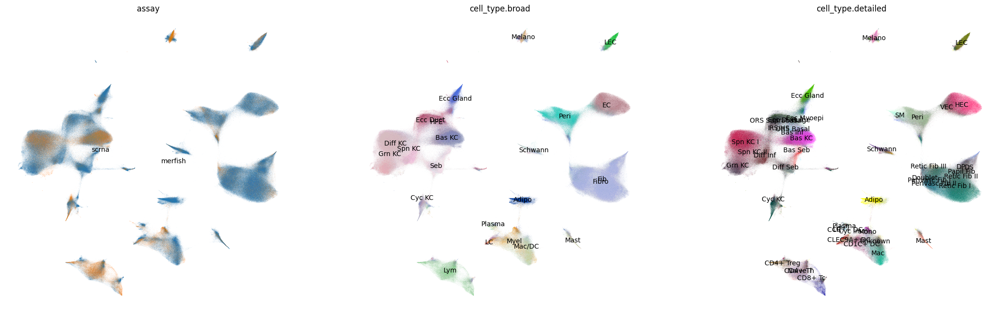

In [16]:
rcParams["figure.figsize"] = (8,8)
sc.pl.embedding(merged, basis='harmony_umap', color=["assay", 'cell_type.broad', "cell_type.detailed"], frameon=False, legend_loc='on data', legend_fontweight='normal')

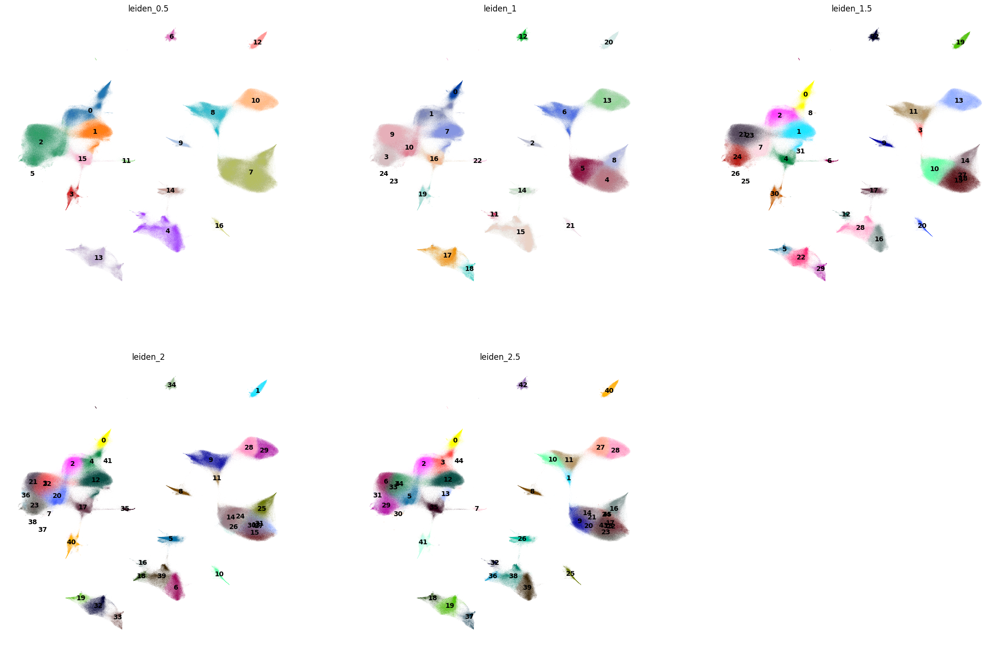

In [17]:
rcParams["figure.figsize"] = (8,8)
sc.pl.embedding(merged, basis='harmony_umap', color=['leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5'],ncols=3, frameon=False, legend_loc='on data')

In [18]:
cluster_df = merged.obs.loc[scrna.obs_names, ['leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5']].copy()

In [19]:
scrna.obsm['merged_umap'] = merged[scrna.obs_names].obsm['harmony_umap'].copy()

In [20]:
scrna.obs = pd.concat([scrna.obs, cluster_df], axis=1).copy()

In [21]:
scrna

AnnData object with n_obs × n_vars = 273178 × 14762
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'pct.mito', 'pct.ribo', 'pct.hemo', 'study_id', 'sample_barcode', 'donor_id', 'donor_sex', 'donor_age', 'anatomic_site', 'reported.cell_type', 'anatomic_site.detailed', 'harmony.snn_res.0.2', 'harmony.snn_res.0.4', 'harmony.snn_res.0.5', 'harmony.snn_res.0.6', 'harmony.snn_res.0.8', 'harmony.snn_res.1', 'harmony.snn_res.1.2', 'harmony.snn_res.1.5', 'harmony.snn_res.2', 'harmony.snn_res.2.5', 'seurat_clusters', 'cell_barcode', 'cell_type.broad', 'cell_category', 'cell_type', 'cell_type.broad.res_0.2', 'cell_type.detailed', 'cell_type.reclustered', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_va

In [23]:
scrna.write_h5ad("data/normal_skin.scrna.harmony.integrated.reclustered.annotated.genes_filtered.tangram_input.merged.h5ad")

In [24]:
import liana as li
li.resource.show_resources()

['baccin2019',
 'cellcall',
 'cellchatdb',
 'cellinker',
 'cellphonedb',
 'celltalkdb',
 'connectomedb2020',
 'consensus',
 'embrace',
 'guide2pharma',
 'hpmr',
 'icellnet',
 'italk',
 'kirouac2010',
 'lrdb',
 'mouseconsensus',
 'ramilowski2015']

In [25]:
cellchat_table = pd.read_csv("/sc/arion/projects/ji_lab/USER/restrp01/ns-atlas/data/cellchat/CellChatDB_interaction_table.csv", index_col=0)
cellchat_table['ligand'] = cellchat_table['ligand.symbol'].apply(lambda x: x.replace(", ", "_"))
cellchat_table['receptor'] = cellchat_table['receptor.symbol'].apply(lambda x: x.replace(", ", "_"))
cellchat_table = cellchat_table[['ligand', 'receptor']].copy()
cellchat_table.head()

,ligand,receptor
TGFB1_TGFBR1_TGFBR2,TGFB1,TGFBR2_TGFBR1
TGFB2_TGFBR1_TGFBR2,TGFB2,TGFBR2_TGFBR1
TGFB3_TGFBR1_TGFBR2,TGFB3,TGFBR2_TGFBR1
TGFB1_ACVR1B_TGFBR2,TGFB1,TGFBR2_ACVR1B
TGFB1_ACVR1C_TGFBR2,TGFB1,TGFBR2_ACVR1C


In [26]:
lrdb = pd.concat([
    li.resource.select_resource("consensus"), 
    li.resource.select_resource("cellchatdb"), 
    li.resource.select_resource("cellphonedb")
]).drop_duplicates()

lrdb['ligand'] = lrdb['ligand'].apply(lambda x: x.replace("COMPLEX:", ""))
lrdb['receptor'] = lrdb['receptor'].apply(lambda x: x.replace("COMPLEX:", ""))
lrdb = pd.concat([lrdb, cellchat_table]).drop_duplicates()
lrdb.head()

,ligand,receptor
0,LGALS9,PTPRC
1,LGALS9,MET
2,LGALS9,CD44
3,LGALS9,LRP1
4,LGALS9,CD47


In [29]:
def flatten_list(xss):
    return [x for xs in xss for x in xs]

In [30]:
ligands = lrdb['ligand'].apply(lambda x: x.split('_')).tolist()
ligand_genes = np.unique(flatten_list(ligands))
receptors = lrdb['receptor'].apply(lambda x: x.split('_')).tolist()
receptor_genes = np.unique(flatten_list(receptors))
lr_genes = np.unique(np.concatenate([ligand_genes, receptor_genes]))

In [31]:
len(lr_genes)

2207

In [32]:
lr_genes

array(['A1BG', 'A2M', 'AANAT', ..., 'ZG16B', 'ZNRF3', 'ZP3'], dtype='<U9')

In [33]:
# Select highly variable genes
sc.pp.highly_variable_genes(scrna, layer='log1p', n_top_genes=5000, inplace=True, subset=False)
hvgenes = scrna.var_names[scrna.var['highly_variable']].tolist()

In [34]:
lr_genes = np.intersect1d(scrna.var_names, lr_genes)

In [35]:
len(lr_genes)

1624

In [36]:
len(np.intersect1d(hvgenes, lr_genes))

982

In [42]:
len(np.intersect1d(hvgenes, merfish.var_names))

434

In [43]:
genes2keep = np.unique(np.concatenate([merfish.var_names, hvgenes, lr_genes]))

In [44]:
len(genes2keep)

5688

In [45]:
scrna = scrna[:, genes2keep].copy()

In [46]:
scrna.write_h5ad("data/normal_skin.scrna.harmony.integrated.reclustered.annotated.mini.h5ad")

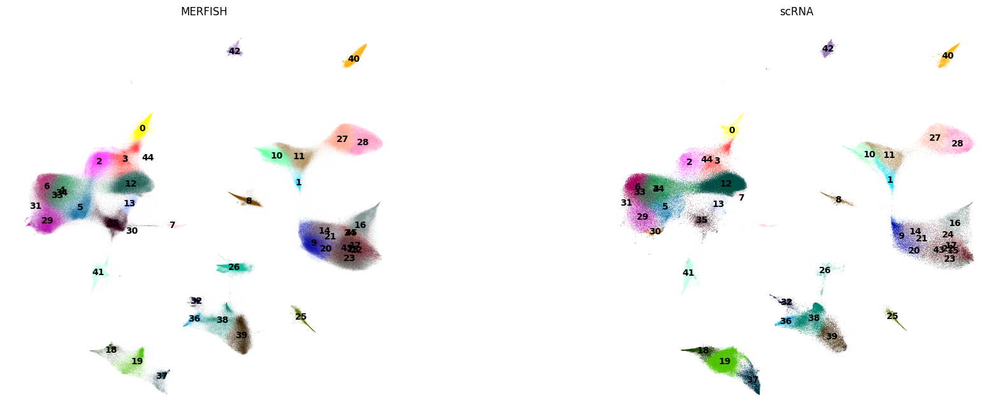

In [47]:
# Number of Axes & plot size
ncols = 2
nrows = 1
figsize = 8
wspace = 0.5
fig, axs = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(ncols * figsize + figsize * wspace * (ncols - 1), nrows * figsize),
)
plt.subplots_adjust(wspace=wspace)
sc.pl.embedding(merged[merged.obs['assay'] == 'merfish'], basis='harmony_umap', color='leiden_2.5', legend_loc='on data', frameon=False, title='MERFISH', ax=axs[0], show=False)
sc.pl.embedding(scrna, basis='merged_umap', color='leiden_2.5', legend_loc='on data', frameon=False, title='scRNA', ax=axs[1])

In [51]:
detailed_celltype_colors = pd.read_csv("data/cell_type.detailed.color_palette.varibow.non_shuffled.csv", index_col=0)

In [58]:
detailed_celltype_colors = detailed_celltype_colors['varibow.detailed'].to_dict()

In [68]:
merfish = merfish[merfish.obs['cell_type.detailed'] != 'Doublet'].copy()
merfish = merfish[merfish.obs['cell_type.detailed'] != 'Unknown'].copy()

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_spatial_by_sample(
    adata,
    annot_key,
    sample_key="sample_barcode",
    palette=None,
    ncols=9,
    figsize=(5, 5)
):
    samples = adata.obs[sample_key].cat.categories.unique().sort_values()
    n_samples = len(samples)

    ncols = min(n_samples, ncols)
    nrows = (n_samples + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize[0]*ncols, figsize[1]*nrows))
    axes = np.array(axes).reshape(-1)

    for i, sample in enumerate(samples):
        ax = axes[i]
        adata_sub = adata[adata.obs[sample_key] == sample]

        ax.set_aspect('equal', adjustable='datalim')
        ax.set_xticks([])
        ax.set_yticks([])

        sc.pl.embedding(adata_sub,
                        basis='spatial', 
                        title=f"{sample}", 
                        color=annot_key,
                        palette=palette,  
                        ax=ax,
                        legend_loc='none', 
                        show=False)
        
        ax.axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)


    plt.tight_layout()
    plt.savefig(f"figures/{annot_key}.spatial_plot.png", dpi=300)
    plt.show()
    plt.close()

/hpc/packages/minerva-rocky9/py_packages/3.12/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/hpc/packages/minerva-rocky9/py_packages/3.12/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/hpc/packages/minerva-rocky9/py_packages/3.12/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/hpc/packages/minerva-rocky9/py_packages/3.12/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/hpc/packages/minerva-rocky9/py_packages/3.12/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns

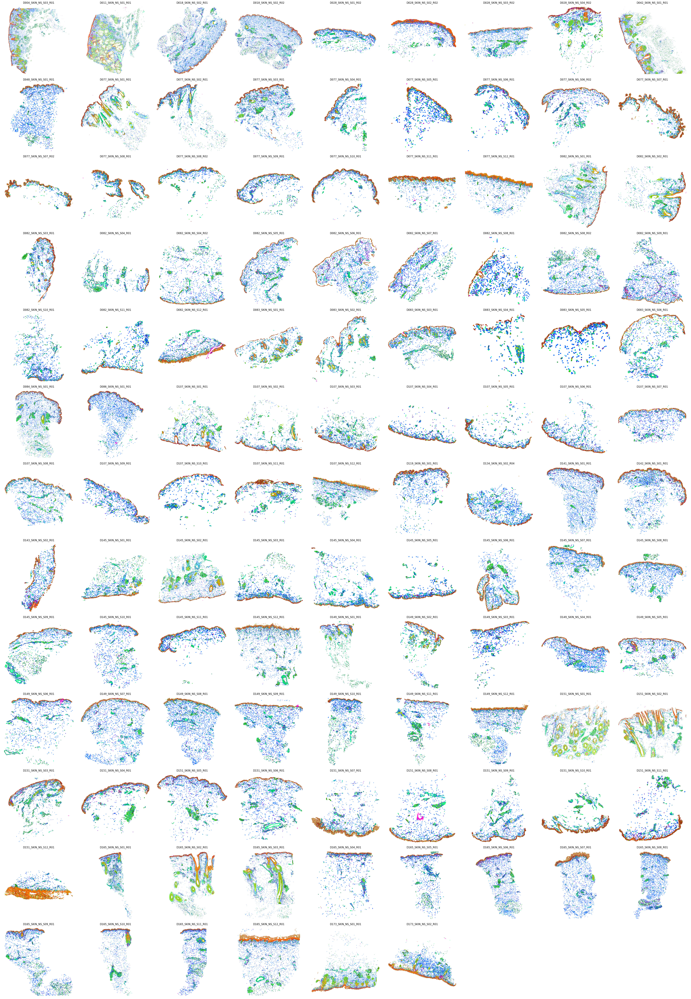

In [77]:
plot_spatial_by_sample(merfish, annot_key='cell_type.detailed', palette=detailed_celltype_colors)